# Projeto - Perceptron e MLP

## 

Para resolver o primeiro mini projeto, o aluno ou o grupo de alunos (grupo de no máximo 3 pessoas) devem escolher um `dataset` a escolha de vocês ou um dos `datasets` indicados no _Drive_ da turma para realizar o projeto. A partir do `dataset` escolhido, desenvolva os itens abaixo:

__A)__ (10 pontos) Desenvolva uma análise exploratória dos dados adequada;

__B)__ (5 pontos) Faça a preparação dos dados para treinar os modelos;

__C)__ (15 pontos) Teste pelo menos 3 modelos de _Machine Learning_ convencional, sendo algumas sugestões como Regressão Logística, Árvore de Decisão, _Random Forest_ entre outros;

__D)__ (30 pontos) Desenvolva uma rede neural _Perceptron_ para fazer a separação entre as classes. O modelo consegue fazer a separação linear dos dados? Avaliar utilizando o PCA caso necessário;

__E)__ (30 pontos) Monte duas redes neurais MLP utilizando combinações de camadas diferentes (teste algumas combinações para chegar em uma melhor performance dos resultados).

__F)__ (10 pontos) Qual dos modelos teve a melhor performance entre os modelos convencionais, _Perceptron_ e MLP? Discuta um pouco a respeito.

<br>

__Entrega:__ até o dia 30/09 pelo Class (vou criar uma atividade como projeto para que vocês entreguem por lá)

__Monitoria:__ dia 20/09 e 27/09;

In [1]:
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, MinMaxScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, f1_score, confusion_matrix
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from mlxtend.plotting import plot_confusion_matrix

from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.over_sampling import SMOTE

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.svm import SVC
from warnings import simplefilter

simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore")

In [2]:
df = pd.read_csv("../Projeto/datasets/banco_train.csv", sep=";")
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [3]:
pd.options.display.max_rows = 400       # Almentando as linhas para visualização.
pd.options.display.max_columns = 400    # Almentando as colunas.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [5]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [6]:
df.describe(include="all")

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
count,45211.000000,45211,45211,45211,45211,45211.000000,45211,45211,45211,45211.000000,45211,45211.000000,45211.000000,45211.000000,45211.000000,45211,45211
unique,NaN,12,3,4,2,NaN,2,2,3,NaN,12,NaN,NaN,NaN,NaN,4,2
top,NaN,blue-collar,married,secondary,no,NaN,yes,no,cellular,NaN,may,NaN,NaN,NaN,NaN,unknown,no
freq,NaN,9732,27214,23202,44396,NaN,25130,37967,29285,NaN,13766,NaN,NaN,NaN,NaN,36959,39922
mean,40.936210,NaN,NaN,NaN,NaN,1362.272058,NaN,NaN,NaN,15.806419,NaN,258.163080,2.763841,40.197828,0.580323,NaN,NaN
std,10.618762,NaN,NaN,NaN,NaN,3044.765829,NaN,NaN,NaN,8.322476,NaN,257.527812,3.098021,100.128746,2.303441,NaN,NaN
min,18.000000,NaN,NaN,NaN,NaN,-8019.000000,NaN,NaN,NaN,1.000000,NaN,0.000000,1.000000,-1.000000,0.000000,NaN,NaN
25%,33.000000,NaN,NaN,NaN,NaN,72.000000,NaN,NaN,NaN,8.000000,NaN,103.000000,1.000000,-1.000000,0.000000,NaN,NaN
50%,39.000000,NaN,NaN,NaN,NaN,448.000000,NaN,NaN,NaN,16.000000,NaN,180.000000,2.000000,-1.000000,0.000000,NaN,NaN
75%,48.000000,NaN,NaN,NaN,NaN,1428.000000,NaN,NaN,NaN,21.000000,NaN,319.000000,3.000000,-1.000000,0.000000,NaN,NaN


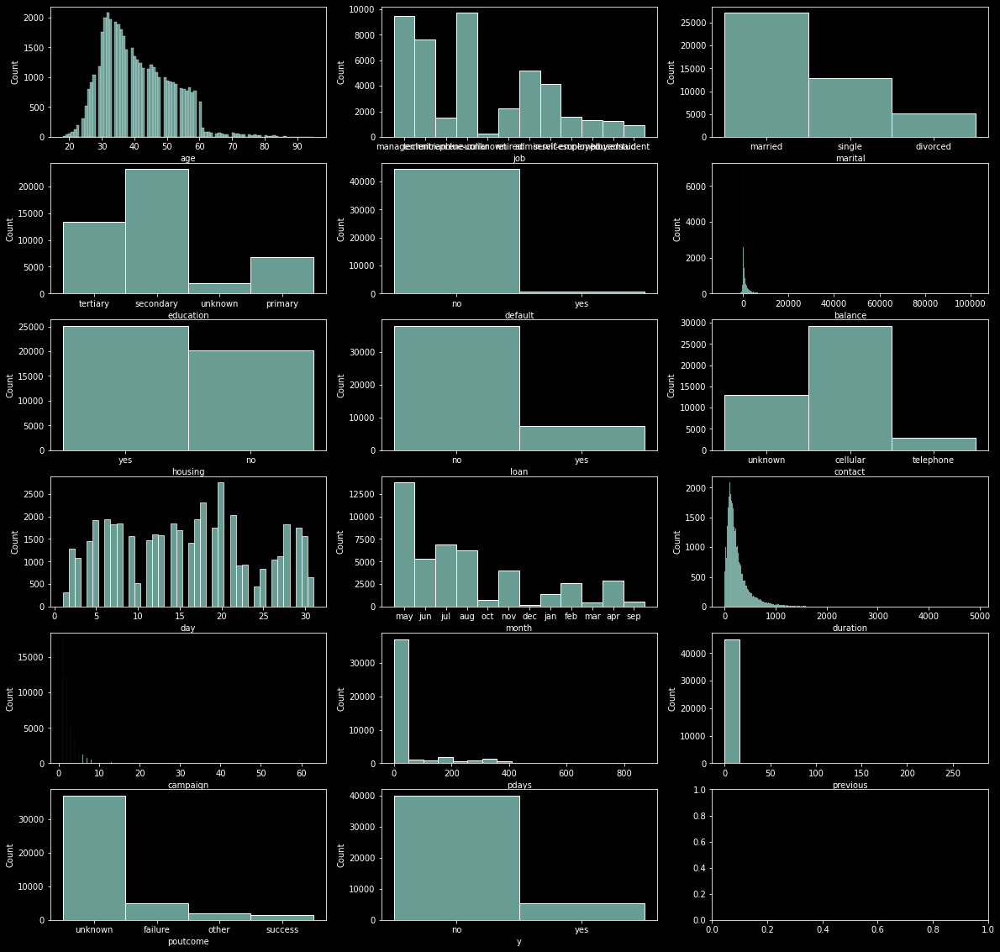

In [7]:
fig, ax = plt.subplots(6, 3, figsize=(20, 20))
ax = ax.flatten()

for i, col in enumerate(df):
    
    sns.histplot(df[col], ax=ax[i])

plt.show()

In [8]:
df.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


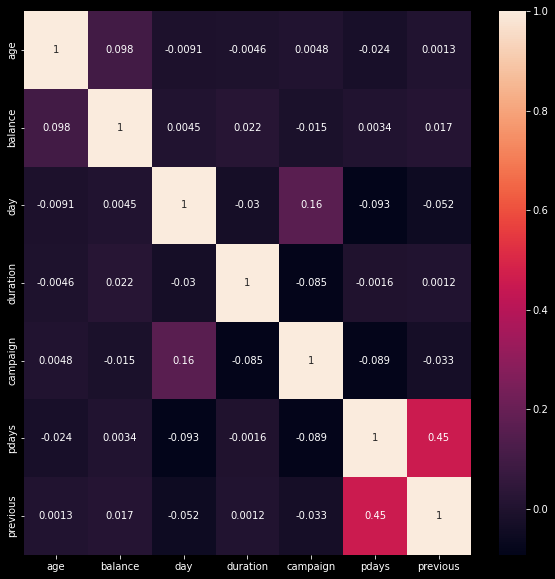

In [9]:
plt.figure(figsize=(10, 10))

sns.heatmap(df.corr(), annot=True);

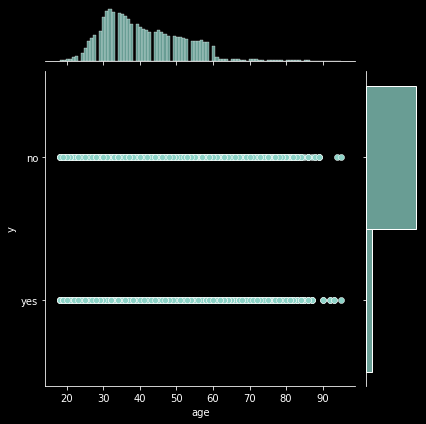

In [10]:
sns.jointplot(data=df, x=df["age"], y="y")
plt.show()

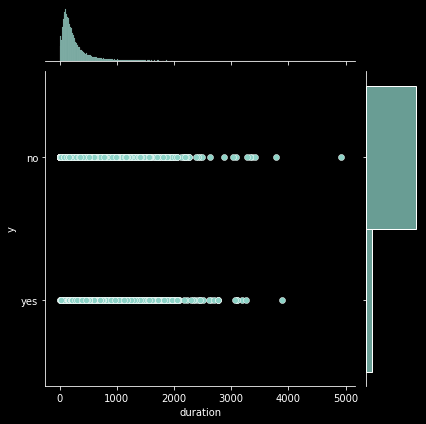

In [11]:
sns.jointplot(data=df, x=df["duration"], y="y")
plt.show()

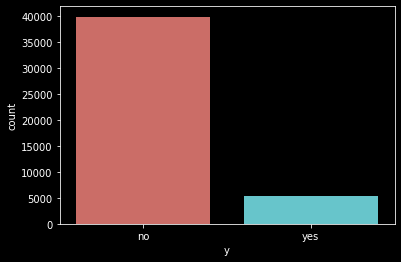

In [12]:
sns.countplot(x='y',data=df, palette='hls')
plt.show()

In [13]:
print(f"percentual não convertido", len(df[df["y"]=="no"])/len(df[df["y"]!=0]))
print(f"percentual convertido", len(df[df["y"]=="yes"])/len(df[df["y"]!=0]))

percentual não convertido 0.8830151954170445
percentual convertido 0.11698480458295547


In [14]:
df.groupby("job").mean()

,age,balance,day,duration,campaign,pdays,previous
job,,,,,,,
admin.,39.289886,1135.838909,15.564301,246.896732,2.575324,47.859021,0.671630
blue-collar,40.044081,1078.826654,15.442561,262.901562,2.816995,44.033498,0.505138
entrepreneur,42.190989,1521.470074,15.702085,256.309348,2.799597,32.486214,0.478144
housemaid,46.415323,1392.395161,16.002419,245.825000,2.820968,21.505645,0.371774
management,40.449567,1763.616832,16.114189,253.995771,2.864348,38.665468,0.668006
retired,61.626767,1984.215106,15.439488,287.361307,2.346731,37.443905,0.638693
self-employed,40.484484,1647.970868,16.027866,268.157061,2.853072,34.747308,0.551615
services,38.740250,997.088108,15.635532,259.318729,2.718344,41.995185,0.501204
student,26.542644,1388.060768,14.897655,246.656716,2.299574,57.041578,0.953092


In [15]:
df.groupby("marital").mean()

,age,balance,day,duration,campaign,pdays,previous
marital,,,,,,,
divorced,45.782984,1178.872287,15.796428,262.517188,2.630882,41.001728,0.551373
married,43.408099,1425.925590,15.854487,253.412765,2.842875,37.950467,0.556552
single,33.703440,1301.497654,15.708210,266.497967,2.649805,44.652385,0.642690


In [16]:
df.groupby("education").mean()

,age,balance,day,duration,campaign,pdays,previous
education,,,,,,,
primary,45.865567,1250.949934,15.421398,255.933002,2.834331,36.081740,0.489272
secondary,39.964270,1154.880786,15.759159,258.685760,2.700802,42.353504,0.567753
tertiary,39.593640,1758.416435,16.086535,258.518532,2.825577,39.024134,0.661980
unknown,44.510501,1526.754443,15.810985,257.313947,2.849219,36.856220,0.488422


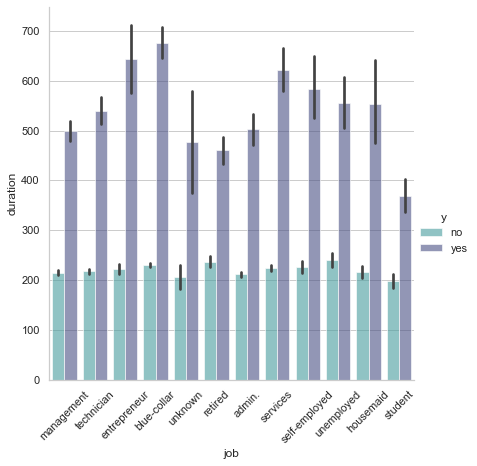

In [17]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="job", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

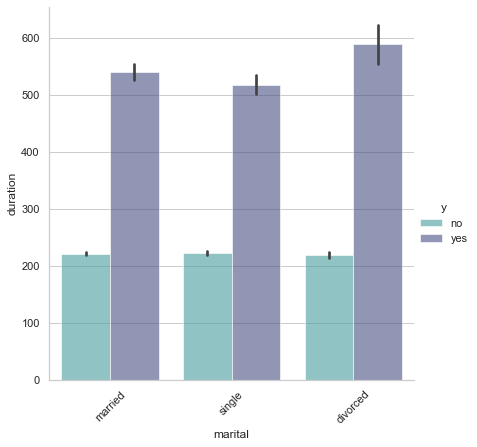

In [18]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="marital", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

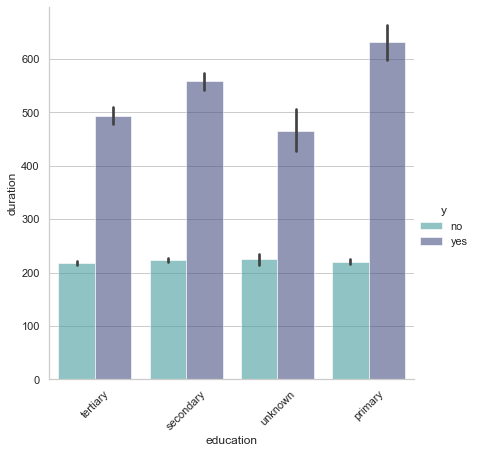

In [19]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="education", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

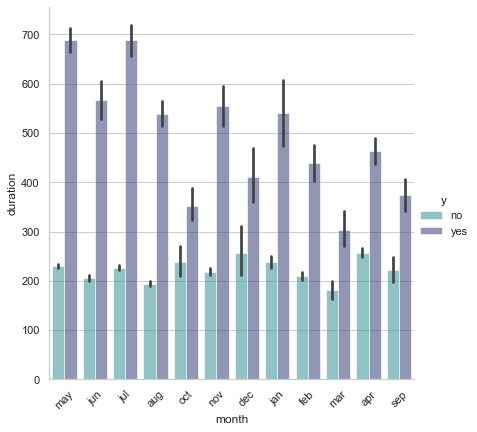

In [20]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="month", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

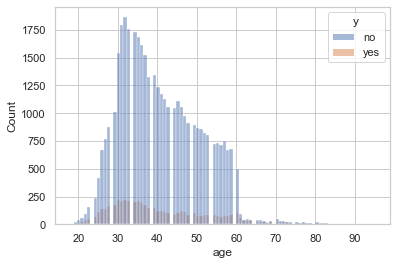

In [21]:
sns.histplot(data=df, x="age", hue="y");

In [22]:
features_cat = df.select_dtypes(exclude=np.number).columns.tolist()
features_cat

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'y']

In [23]:
features_num = df.select_dtypes(include=np.number).columns.tolist()
features_num

['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

In [24]:
def pipe_pre_process(df=df, drop_not_features=["y"], 
                     col_target="y",
                     inputer_num_strategy="mean",
                     encoding="onehot"):
    '''
    - inputer_num_strategy (str): "mean", "median";
    - encoding (str): "onehot" para OneHotEncoder; "ordinal" OrdinalEncoder;
    '''
    
    label = LabelEncoder()
    
    X = df.drop(columns=drop_not_features);
    y_target = df[col_target]
    
    y = pd.DataFrame(y_target);
    
    y["y"] = label.fit_transform(y["y"]);
          
    ax = sns.countplot(x=y["y"]);
    
    print(f'Verificando as Target Balanceadas.{ax}');
 
    # ==========================================================
    features_num = X.select_dtypes(include=np.number).columns.to_list();

    pipe_features_num = imbpipeline([("input_num", SimpleImputer(strategy=inputer_num_strategy)),
                                  ("std", StandardScaler())]);

    # ==========================================================
    
    features_cat = X.select_dtypes(exclude=np.number).columns.to_list();
    
    if encoding == "onehot":
    
        pipe_features_cat = imbpipeline([("input_cat", SimpleImputer(strategy="constant", fill_value="unknown")),
                                      ("onehot", OneHotEncoder(handle_unknown="ignore"))]);
        
    elif encoding == "ordinal":
        
        pipe_features_cat = imbpipeline([("input_cat", SimpleImputer(strategy="constant", fill_value="unknown")),
                                         ("ordinal", OrdinalEncoder(handle_unknown="use_encoded_value",
                                                                 unknown_value=-1))]);
    
    else:
        
        raise ValueError("Únicos encodings disponíveis são 'ordinal' e 'onehot'");
        
    # ==========================================================

    pre_processador = ColumnTransformer(transformers=[("transf_num", pipe_features_num, features_num),
                                                      ("transf_cat", pipe_features_cat, features_cat)]);
    
    X = pre_processador.fit_transform(X);
    
    # ==========================================================
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y);
    
    smt = SMOTE()
    
    X_train, y_train = smt.fit_resample(X_train, y_train);
    
    return X_train, X_test, y_train, y_test

Verificando as Target Balanceadas.AxesSubplot(0.125,0.125;0.775x0.755)


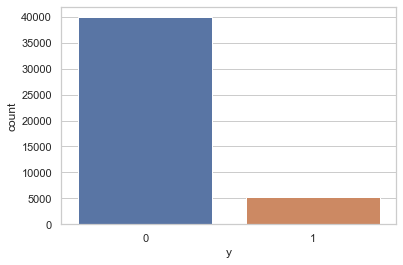

In [25]:
X_train, X_test, y_train, y_test = pipe_pre_process(df=df, drop_not_features=["y"], 
                                                           col_target="y",
                                                           inputer_num_strategy="median",
                                                           encoding="onehot");

In [26]:
#X_train = np.asarray(X_train).astype(np.float32)
#y_train = np.asarray(y_train).astype(np.float32)

In [27]:
def metricas_classificacao(estimator, X_train, X_test, y_train, y_test):
    
    # ============================================

    print("\nMétricas de avaliação de treino:")
    
    y_pred_train = estimator.predict(X_train)

    ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
    plt.show()

    print(classification_report(y_train, y_pred_train))

    # ============================================

    print("\nMétricas de avaliação de teste:")

    y_pred_test = estimator.predict(X_test)

    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
    plt.show()

    print(classification_report(y_test, y_pred_test))

    # ============================================

    f1_score_weighted = f1_score(y_test, y_pred_test, average='weighted')
    print(f"F1-score weighted: {100*f1_score_weighted:.2f}")
    return f1_score_weighted

In [28]:
def clf_metrics_com_return(modelo, X, y_true, label, plot_conf_mat=True, print_cr=True):
    
    if print_cr:
        print(f"\nMétricas de avaliação de {label}:\n")
    
    y_pred = modelo.predict(X)

    if plot_conf_mat:
        fig, ax = plt.subplots(1, 2, figsize=(12, 4))

        ConfusionMatrixDisplay.from_predictions(y_true, y_pred, ax=ax[0]) 
        ConfusionMatrixDisplay.from_predictions(y_true, y_pred, normalize="all", ax=ax[1])
        plt.show()

    if print_cr:
        print(classification_report(y_true, y_pred))
    
    return classification_report(y_true, y_pred, output_dict=True)

In [29]:
pipe_logit = LogisticRegression(random_state=42);

pipe_rf = RandomForestClassifier(random_state=42);

pipe_dt = DecisionTreeClassifier(random_state=42);

pipe_svm = SVC(random_state=42);

pipe_gb = GradientBoostingClassifier(n_estimators=20, random_state=42);

# =======================================

dict_pipes = {"logit" : pipe_logit,
              "random forest" : pipe_rf,
              "decision tree" : pipe_dt,
              "svm" : pipe_svm,
              "Gradiente" : pipe_gb}

# =======================================
# experimento!

resultado_experimentos = {"estimador" : [],
                          "f1_treino" : [],
                          "f1_teste" : []}

print_progress = False

for label, pipe in dict_pipes.items():
    
    if print_progress:
        print("\n")
        print("="*80)
        print(f"Estimador: {label}".center(80))
        print("(com hiperparâmetros default)".center(80))
        print("="*80)
        print("\n")

    # ================================
    
    pipe.fit(X_train, y_train);

    # ================================
    # Passo 2

    dict_metricas_treino = clf_metrics_com_return(pipe, X_train, y_train, "treino", plot_conf_mat=False, print_cr=False);
    
    if print_progress:
        print("#"*80)
        
    dict_metricas_teste = clf_metrics_com_return(pipe, X_test, y_test, "teste", plot_conf_mat=False, print_cr=False);
    
    # pegar as métricas pra salvar abaixo!
    f1_treino = dict_metricas_treino["weighted avg"]["f1-score"]
    f1_teste = dict_metricas_teste["weighted avg"]["f1-score"]
    
    # ================================
    # guardando os resultados do experimento
    
    resultado_experimentos["estimador"].append(label);
    resultado_experimentos["f1_treino"].append(f1_treino);
    resultado_experimentos["f1_teste"].append(f1_teste);
    
    
df_results = pd.DataFrame(resultado_experimentos);

df_results["gap"] = (df_results["f1_treino"] - df_results["f1_teste"]).apply(lambda x: x if x > 0 else np.inf);

df_results = df_results.sort_values("f1_teste", ascending=False).sort_values("gap");

df_results

c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\wiltd\AppData\Local\Temp\ipykernel_5704\3335767179.py:40: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  pipe.fit(X_train, y_train);
c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_gb.py:570: DataConversionWarning: A column-vector y was passed wh

,estimador,f1_treino,f1_teste,gap
4,Gradiente,0.856510,0.849226,0.007284
3,svm,0.919963,0.877369,0.042594
1,random forest,1.000000,0.902611,0.097389
2,decision tree,1.000000,0.875976,0.124024
0,logit,0.848074,0.866252,inf


## Perceptron

In [30]:
print(X_train.shape, y_test.shape)

(63874, 51) (9043, 1)


In [31]:
cv = RepeatedStratifiedKFold(n_splits = 2,
                             n_repeats = 4,
                             random_state = 42)

In [32]:
pcp = Perceptron()

scores = cross_val_score(pcp,
                         X_train,
                         y_train,
                         scoring = 'accuracy',
                         cv = cv,
                         n_jobs = -1)

In [33]:
print('Acurácia Média: %.3f' % (np.mean(scores)))
print('Desvio Padrão Médio: %.3f' % (np.std(scores)))

Acurácia Média: 0.772
Desvio Padrão Médio: 0.045


## PCA

In [34]:
print(X_train.shape, X_test.shape)

(63874, 51) (9043, 51)


In [35]:
pca = PCA(n_components=30) # feito teste com n_componentes 30 parametros foi onde teve pouca perda em relação a quantidade retirada de feature.

In [36]:
X_train_pca = pca.fit_transform(X_train)
X_teste_pca = pca.transform(X_test)

In [37]:
X_teste_pca.shape, X_teste_pca.shape

((9043, 30), (9043, 30))

In [38]:
X_teste_pca

array([[-0.57243404, -0.48444022, -0.18796166, ...,  0.16317023,
        -0.04280019, -0.03815708],
       [-0.36357927, -1.1852431 , -0.03759114, ...,  0.10335904,
        -0.00357188, -0.01166326],
       [-0.48269527, -1.05959343, -1.00825663, ..., -0.19402051,
        -0.1230159 , -0.00320055],
       ...,
       [-0.61148408, -0.42024274, -0.74412816, ...,  0.20463385,
         0.04204564,  0.00949933],
       [ 2.34433207,  0.47512262, -2.09579174, ...,  0.54081773,
         0.15682683, -0.14082552],
       [ 1.96322718,  0.05950756, -0.5404088 , ...,  0.16290955,
         0.10692684, -0.1288062 ]])

In [39]:
pca.explained_variance_ratio_.sum()

0.97810787

## perceptron após PCA

In [40]:
scores = cross_val_score(pcp,
                         X_train_pca,
                         y_train,
                         scoring = 'accuracy',
                         cv = cv,
                         n_jobs = -1)

In [41]:
print('Acurácia Média: %.3f' % (np.mean(scores)))
print('Desvio Padrão Médio: %.3f' % (np.std(scores)))

Acurácia Média: 0.758
Desvio Padrão Médio: 0.044


In [42]:
rede_simples = Sequential()

## Rede Neural

In [43]:
rede_simples.add(Dense(16, 
            input_dim = X_train.shape[1]))
rede_simples.add(Activation('relu'))

rede_simples.add(Dense(32))
rede_simples.add(Activation('relu'))

rede_simples.add(Dense(8))
rede_simples.add(Activation('relu'))

rede_simples.add(Dense(y_train.shape[1]))
rede_simples.add(Activation('sigmoid'))

In [44]:
rede_simples.compile(loss = 'binary_crossentropy',
                     optimizer = "adam",
                     metrics=['accuracy'])

pesos_iniciais = rede_simples.get_weights()

rede_simples.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                832       
                                                                 
 activation (Activation)     (None, 16)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                544       
                                                                 
 activation_1 (Activation)   (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 8)                 264       
                                                                 
 activation_2 (Activation)   (None, 8)                 0         
                                                                 
 dense_3 (Dense)             (None, 1)                 9

In [45]:
early_stop = EarlyStopping(monitor = 'val_loss',
                           min_delta = 0.0010,
                          patience = 5,
                          verbose = 1,
                          mode = 'auto')

In [46]:
historico = rede_simples.fit(X_train,
                             y_train,
                             epochs = 100,
                             verbose = 1,
                             validation_data = (X_test, y_test),
                             callbacks = [early_stop])

Epoch 1/100
1997/1997 [==============================] - 2s 929us/step - loss: 0.3515 - accuracy: 0.8490 - val_loss: 0.4151 - val_accuracy: 0.8048
Epoch 2/100
1997/1997 [==============================] - 2s 933us/step - loss: 0.3043 - accuracy: 0.8758 - val_loss: 0.3663 - val_accuracy: 0.8280
Epoch 3/100
1997/1997 [==============================] - 2s 883us/step - loss: 0.2874 - accuracy: 0.8824 - val_loss: 0.4206 - val_accuracy: 0.8053
Epoch 4/100
1997/1997 [==============================] - 2s 919us/step - loss: 0.2780 - accuracy: 0.8864 - val_loss: 0.2727 - val_accuracy: 0.8759
Epoch 5/100
1997/1997 [==============================] - 2s 849us/step - loss: 0.2708 - accuracy: 0.8906 - val_loss: 0.3307 - val_accuracy: 0.8428
Epoch 6/100
1997/1997 [==============================] - 2s 831us/step - loss: 0.2656 - accuracy: 0.8931 - val_loss: 0.2846 - val_accuracy: 0.8621
Epoch 7/100
1997/1997 [==============================] - 2s 862us/step - loss: 0.2610 - accuracy: 0.8949 - val_loss: 0

In [47]:
y_pred = np.argmax(rede_simples.predict(X_test), axis = 1)
y_pred

283/283 [==============================] - 0s 571us/step


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [48]:
print(classification_report(y_test, y_pred));

              precision    recall  f1-score   support

           0       0.88      1.00      0.94      7985
           1       0.00      0.00      0.00      1058

    accuracy                           0.88      9043
   macro avg       0.44      0.50      0.47      9043
weighted avg       0.78      0.88      0.83      9043



c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

Matriz de confusão do modelo nos dados de teste:



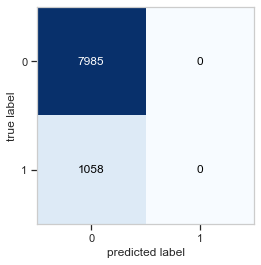

In [49]:
matriz = confusion_matrix(y_test, y_pred)

print("Matriz de confusão do modelo nos dados de teste:\n")
plot_confusion_matrix(conf_mat=matriz)
plt.show()

In [50]:
# loss e val_loss
loss = historico.history['loss']
val_loss = historico.history['val_loss']
epochs = range(len(loss))

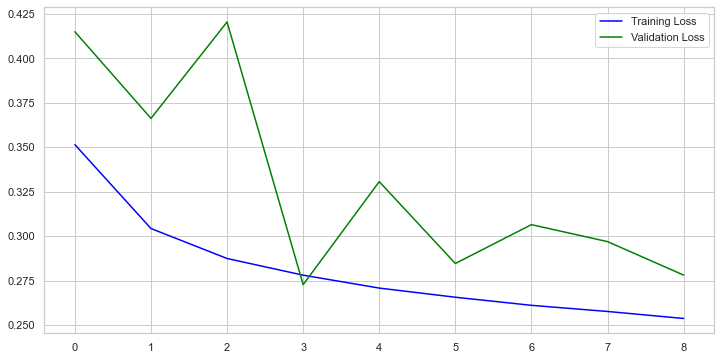

In [51]:
plt.figure(figsize = (12, 6))
plt.plot(epochs, loss, 'blue', label = 'Training Loss')
plt.plot(epochs, val_loss, 'green', label = 'Validation Loss')
plt.legend()
plt.show()

In [52]:
model = Sequential()


model.add(Dense(16, 
            input_dim = X_train.shape[1]))
model.add(Activation('relu'))

model.add(Dense(16))
model.add(Activation('relu'))

model.add(Dense(y_train.shape[1]))
model.add(Activation('sigmoid'))


In [53]:
early_stop = EarlyStopping(monitor = 'val_loss',
                           min_delta = 0.0010,
                          patience = 5,
                          verbose = 1,
                          mode = 'auto')

In [54]:
model.compile(loss = 'binary_crossentropy',
                     optimizer = "adam",
                     metrics=['accuracy'])

pesos_iniciais = model.get_weights()

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 16)                832       
                                                                 
 activation_4 (Activation)   (None, 16)                0         
                                                                 
 dense_5 (Dense)             (None, 16)                272       
                                                                 
 activation_5 (Activation)   (None, 16)                0         
                                                                 
 dense_6 (Dense)             (None, 1)                 17        
                                                                 
 activation_6 (Activation)   (None, 1)                 0         
                                                                 
Total params: 1,121
Trainable params: 1,121
Non-traina

In [55]:
loss_earl = model.fit(X_train,
                      y_train,
                      epochs = 100,
                      verbose = 1,
                      validation_data = (X_test, y_test),
                      callbacks = [early_stop])

Epoch 1/100
1997/1997 [==============================] - 2s 910us/step - loss: 0.3579 - accuracy: 0.8461 - val_loss: 0.3349 - val_accuracy: 0.8410
Epoch 2/100
1997/1997 [==============================] - 2s 881us/step - loss: 0.3023 - accuracy: 0.8763 - val_loss: 0.3699 - val_accuracy: 0.8270
Epoch 3/100
1997/1997 [==============================] - 2s 855us/step - loss: 0.2899 - accuracy: 0.8831 - val_loss: 0.3446 - val_accuracy: 0.8330
Epoch 4/100
1997/1997 [==============================] - 2s 883us/step - loss: 0.2823 - accuracy: 0.8863 - val_loss: 0.3341 - val_accuracy: 0.8388
Epoch 5/100
1997/1997 [==============================] - 2s 862us/step - loss: 0.2766 - accuracy: 0.8887 - val_loss: 0.3366 - val_accuracy: 0.8368
Epoch 6/100
1997/1997 [==============================] - 2s 786us/step - loss: 0.2716 - accuracy: 0.8908 - val_loss: 0.3180 - val_accuracy: 0.8514
Epoch 7/100
1997/1997 [==============================] - 2s 814us/step - loss: 0.2673 - accuracy: 0.8929 - val_loss: 0

In [56]:
y_pred_2 = np.argmax(model.predict(X_test), axis = 1)
y_pred_2

283/283 [==============================] - 0s 571us/step


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [62]:
print(classification_report(y_test, y_pred_2));

              precision    recall  f1-score   support

           0       0.88      1.00      0.94      7985
           1       0.00      0.00      0.00      1058

    accuracy                           0.88      9043
   macro avg       0.44      0.50      0.47      9043
weighted avg       0.78      0.88      0.83      9043



c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wiltd\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

Matriz de confusão do modelo nos dados de teste:



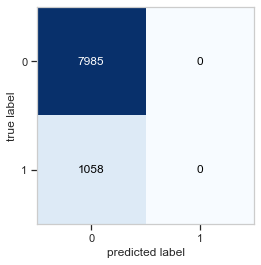

In [58]:
# Crie a matriz de confusão para o pred_labels e test_labels
### COLOQUE SEU CODIGO AQUI ###
matriz = confusion_matrix(y_test, y_pred_2)

print("Matriz de confusão do modelo nos dados de teste:\n")
plot_confusion_matrix(conf_mat=matriz)
plt.show()

In [59]:
# loss e val_loss
loss_2 = loss_earl.history['loss']
val_loss_2 = loss_earl.history['val_loss']
epochs = range(len(loss_2))

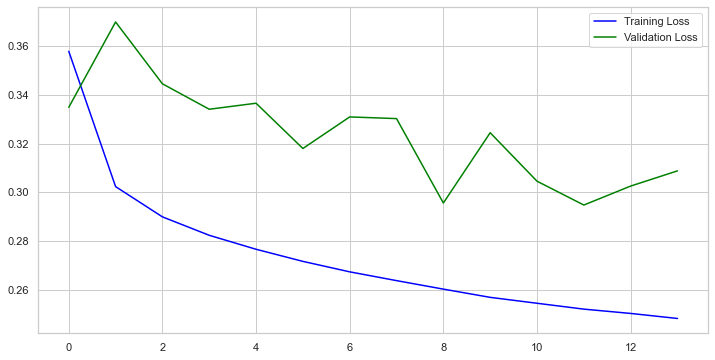

In [60]:
plt.figure(figsize = (12, 6))
plt.plot(epochs, loss_2, 'blue', label = 'Training Loss')
plt.plot(epochs, val_loss_2, 'green', label = 'Validation Loss')
plt.legend()
plt.show()

## 